In [1]:
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
import geopandas as gpd
import hvplot.pandas

np.random.seed(42)

In [2]:
pd.options.display.max_columns = 999

In [3]:
plt.rcParams['figure.figsize'] = (10,6)

## Lecture 12A: Predictive Modeling Part 2
Nov 22, 2021


## Meet "Billie"

- Sybil "Billie" Juliette Hand was born last Tuesday! 
- Mom and baby are doing very well!

<div>
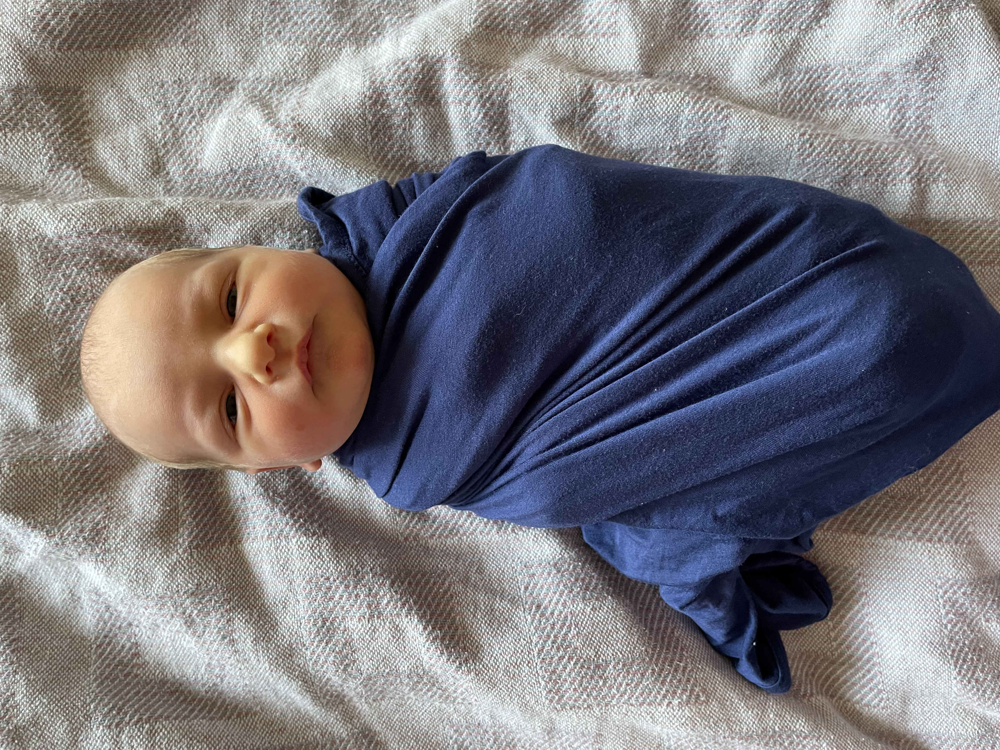
</div>

## Housekeeping

- HW #6 (last optional HW) due on Wednesday
- **Important**: No class on Wednesday due to Thanksgiving holiday
- HW #7 (required) will be posted a week from today 11/29, due on Monday 12/06
    - Includes final project proposal
    - Predictive modeling of housing prices in Philadelphia
- Final project due on December 20

## This week: Predictive modeling continued

**Focus**: much more hands-on experience with featuring engineering and adding spatial based features

- **Part 1:** Housing price modeling continued
- **Part 2:** Predicting bikeshare demand in Philadelphia

## Last time

- An introduction to supervised learning and regression with scikit learn
- **Example:** modeling housing prices in Philadelphia
- **Key concepts:**
    - Linear regression
    - Ridge regression with regularization 
    - Test/train split and $k$-fold cross validation
    - Feature engineering
        - Scaling input features
        - Adding polynomial features
        - One-hot encoding + categorical variables
    - Decision trees and random forests

First, let's setup all of the imports we'll need from scikit learn:

In [4]:
# Models
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor

# Model selection
from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV

# Pipelines
from sklearn.pipeline import make_pipeline

# Preprocessing
from sklearn.preprocessing import StandardScaler, PolynomialFeatures

## Review: Predicting housing prices in Philadelphia

### Load data from the Office of Property Assessment

Let's download data for **single-family** properties in Philadelphia that had their **last sale during 2019.**

Sources: 
- [OpenDataPhilly](https://www.opendataphilly.org/dataset/opa-property-assessments)
- [Metadata](http://metadata.phila.gov/#home/datasetdetails/5543865f20583086178c4ee5/representationdetails/55d624fdad35c7e854cb21a4/)

In [5]:
import carto2gpd

In [6]:
# the CARTO API url
carto_url = "https://phl.carto.com/api/v2/sql"

# The table name
table_name = "opa_properties_public"

# Only pull 2019 sales for single family residential properties
where = "sale_date >= '2019-01-01' AND sale_date < '2020-01-01'" 
where = where + " AND category_code_description = 'Single Family'"

# Run the query
salesRaw = carto2gpd.get(carto_url, table_name, where=where)

# Optional: put it a reproducible order for test/training splits later
salesRaw = salesRaw.sort_values("parcel_number")

In [7]:
salesRaw.head()

,geometry,cartodb_id,assessment_date,basements,beginning_point,book_and_page,building_code,building_code_description,category_code,category_code_description,census_tract,central_air,cross_reference,date_exterior_condition,depth,exempt_building,exempt_land,exterior_condition,fireplaces,frontage,fuel,garage_spaces,garage_type,general_construction,geographic_ward,homestead_exemption,house_extension,house_number,interior_condition,location,mailing_address_1,mailing_address_2,mailing_care_of,mailing_city_state,mailing_street,mailing_zip,market_value,market_value_date,number_of_bathrooms,number_of_bedrooms,number_of_rooms,number_stories,off_street_open,other_building,owner_1,owner_2,parcel_number,parcel_shape,quality_grade,recording_date,registry_number,sale_date,sale_price,separate_utilities,sewer,site_type,state_code,street_code,street_designation,street_direction,street_name,suffix,taxable_building,taxable_land,topography,total_area,total_livable_area,type_heater,unfinished,unit,utility,view_type,year_built,year_built_estimate,zip_code,zoning,pwd_parcel_id,pin,objectid
8617,POINT (-75.14854 39.93144),248857,None,0,"54'7"" E OF AMERICAN",3547465,R30,ROW B/GAR 2 STY MASONRY,1,Single Family,27,Y,None,None,90.00,0.0,0.0,4,0.0,18.03,None,1.0,A,A,1,0.0,None,222,4,222 WHARTON ST,None,None,None,SOUDERTON PA,135 NORFOLK CT,18964,249400.0,None,2.0,3.0,6.0,2.0,0.0,None,CARROLL PATRICK J,CARROLL JULIA ANN,011001660,E,None,2019-08-06T00:00:00Z,009S170309,2019-07-17T00:00:00Z,340000.0,None,None,A,1001,82740,ST,None,WHARTON,None,184058.0,65342.0,F,1622.70,1266.0,A,None,None,None,I,1960,Y,19147,RSA5,None,1001563091,30485072
12318,POINT (-75.14927 39.93033),307318,None,D,"182'11"" W PHILIP",3527524,O50,ROW 3 STY MASONRY,1,Single Family,27,Y,None,None,48.00,45000.0,0.0,2,0.0,15.41,None,0.0,0,A,1,45000.0,None,236,2,236 REED ST,None,None,None,None,None,None,343100.0,None,1.0,3.0,6.0,3.0,0.0,None,GOSS ADAM M,GOSS SARA L,011013000,E,None,2019-06-19T00:00:00Z,010S110184,2019-05-17T00:00:00Z,397500.0,None,None,None,1001,67780,ST,None,REED,None,212703.0,85397.0,F,739.68,1436.0,A,None,None,None,I,1920,None,19147,RSA5,None,1001442246,30546405
7516,POINT (-75.14876 39.93011),232647,None,A,28 FT W PHILIP,3534307,O30,ROW 2 STY MASONRY,1,Single Family,27,Y,None,None,39.00,172346.0,0.0,2,0.0,14.00,None,0.0,0,A,1,0.0,None,205,2,205 GERRITT ST,None,None,None,None,None,None,282200.0,None,1.0,3.0,6.0,2.0,0.0,None,PLATT JACOB,None,011013900,E,None,2019-07-05T00:00:00Z,010S110173,2019-06-06T00:00:00Z,285000.0,None,None,A,1001,36680,ST,None,GERRITT,None,39614.0,70240.0,F,546.00,868.0,A,None,None,None,I,1920,Y,19147,RSA5,None,1001238773,30475638
9952,POINT (-75.14886 39.93012),265587,None,C,56 FT W PHILIP,3465875,O30,ROW 2 STY MASONRY,1,Single Family,27,N,None,None,39.00,100900.0,0.0,4,0.0,14.00,None,0.0,0,A,1,0.0,None,209,4,209 GERRITT ST,None,None,None,None,None,None,186400.0,None,1.0,3.0,6.0,2.0,0.0,None,DEMCHUK JOHN C,DEMCHUK TRACY A,011014100,E,None,2019-01-15T00:00:00Z,010S110171,2019-01-08T00:00:00Z,3.0,None,None,A,1001,36680,ST,None,GERRITT,None,36663.0,48837.0,F,546.00,1008.0,A,None,None,None,I,1920,Y,19147,RSA5,None,1001238777,30500086
15563,POINT (-75.14852 39.92954),369588,None,D,55' W 2ND ST,3518461,O30,ROW 2 STY MASONRY,1,Single Family,27,N,None,None,45.58,45000.0,0.0,3,0.0,15.00,None,0.0,0,A,1,45000.0,None,203,3,203 WILDER ST,None,None,None,None,None,None,209200.0,None,1.0,2.0,0.0,2.0,0.0,None,TESTA AMY,None,011020000,E,None,2019-05-30T00:00:00Z,010S110168,2019-05-28T00:00:00Z,277500.0,None,None,A,1001,83180,ST,None,WILDER,None,109390.0,54810.0,F,683.70,890.0,H,None,None,None,I,1920,None,19147,RSA5,None,1001566428,30591030


In [8]:
len(salesRaw)

24399

In [9]:
# The feature columns we want to use
cols = [
    "sale_price",
    "total_livable_area",
    "total_area",
    "garage_spaces",
    "fireplaces",
    "number_of_bathrooms",
    "number_of_bedrooms",
    "number_stories",
    "exterior_condition",
    "zip_code",
    "geometry"
]

# Trim to these columns and remove NaNs
sales = salesRaw[cols].dropna()

# Trim zip code to only the first five digits
sales['zip_code'] = sales['zip_code'].astype(str).str.slice(0, 5)

In [10]:
# Trim very low and very high sales
valid = (sales['sale_price'] > 3000) & (sales['sale_price'] < 1e6)
sales = sales.loc[valid]

In [11]:
len(sales)

18749

### Let's focus on numerical features only first

In [12]:
# Split the data 70/30
train_set, test_set = train_test_split(sales, 
                                       test_size=0.3, 
                                       random_state=42)

# the target labels: log of sale price
y_train = np.log(train_set["sale_price"])
y_test = np.log(test_set["sale_price"])

# The features
feature_cols = [
    "total_livable_area",
    "total_area",
    "garage_spaces",
    "fireplaces",
    "number_of_bathrooms",
    "number_of_bedrooms",
    "number_stories",
]
X_train = train_set[feature_cols].values
X_test = test_set[feature_cols].values

Run a linear regression model as a baseline:

In [13]:
# Make a linear model pipeline
linear_pipeline = make_pipeline(StandardScaler(), LinearRegression())

# Fit on the training data
linear_pipeline.fit(X_train, y_train)

# What's the test score?
linear_pipeline.score(X_test, y_test)

0.15177090465978138

Run cross-validation on a random forest model:

In [14]:
# Make a random forest pipeline
forest_pipeline = make_pipeline(
    StandardScaler(), RandomForestRegressor(n_estimators=100, random_state=42)
)

# Run the 10-fold cross validation
scores = cross_val_score(
    forest_pipeline,
    X_train,
    y_train,
    cv=10,
)

# Report
print("R^2 scores = ", scores)
print("Scores mean = ", scores.mean())
print("Score std dev = ", scores.std())

R^2 scores =  [0.28618478 0.24997326 0.29835429 0.3492331  0.35147885 0.33138565
 0.32661332 0.28873118 0.35094037 0.31952106]
Scores mean =  0.3152415852505968
Score std dev =  0.03200540774581361


In [15]:
# Fit on the training data
forest_pipeline.fit(X_train, y_train)

# What's the test score?
forest_pipeline.score(X_test, y_test)

0.3023328355639672

### Test score improved!

The model appears to generalize reasonably well

**Note:** we should also be optimizing hyperparameters to see if we can find additional improvements!

### Which variables were most important?

In [16]:
# Extract the regressor from the pipeline
forest_model = forest_pipeline["randomforestregressor"]

In [17]:
# Create the data frame of importances
importance = pd.DataFrame(
    {"Feature": feature_cols, "Importance": forest_model.feature_importances_}
).sort_values("Importance")


importance.hvplot.barh(x="Feature", y="Importance")

:Bars   [Feature]   (Importance)

## On to new material...

## How to handle categorical data?

We can use a technique called **one-hot encoding**

**Steps**:
- Create a new column for each category
- Represent each category as a vector of 1s and 0s

<img src=attachment:one-hot-encoding.png width=600></img>
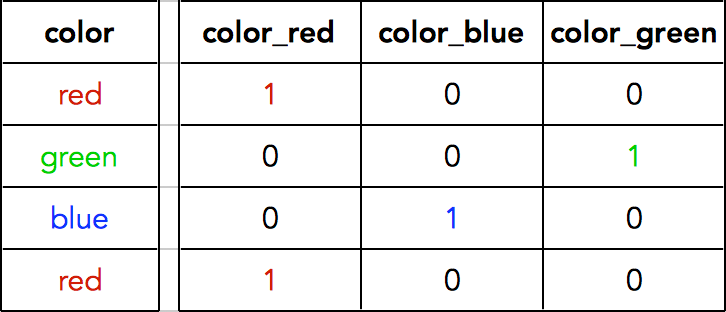

## One-hot encoding in scikit learn

- The [`OneHotEncoder`](https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.OneHotEncoder.html) object is a preprocessor that will perform the vectorization step
- The [`ColumnTransformer`](https://scikit-learn.org/stable/modules/generated/sklearn.compose.ColumnTransformer.html) object will help us apply different transformers to numerical and categorical columns

In [18]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder

Let's try out the example data of colors:

In [19]:
# Example data of colors
colors = np.array(["red", "green", "blue", "red"])
colors = colors[:, np.newaxis]

In [20]:
colors.shape

(4, 1)

In [21]:
colors

array([['red'],
       ['green'],
       ['blue'],
       ['red']], dtype='<U5')

In [22]:
# Initialize the OHE transformer
ohe = OneHotEncoder()

# Fit the transformer and then transform the colors 
ohe.fit_transform(colors).toarray()

array([[0., 0., 1.],
       [0., 1., 0.],
       [1., 0., 0.],
       [0., 0., 1.]])

In [23]:
# The corresponding category for each column
ohe.categories_

[array(['blue', 'green', 'red'], dtype='<U5')]

Let's apply **separate** transformers for our numerical and categorical columns:

In [24]:
# Numerical columns
num_cols = [
    "total_livable_area",
    "total_area",
    "garage_spaces",
    "fireplaces",
    "number_of_bathrooms",
    "number_of_bedrooms",
    "number_stories",
]

# Categorical columns
cat_cols = ["exterior_condition", "zip_code"]

In [25]:
# Set up the column transformer with two transformers
# ----> Scale the numerical columns
# ----> One-hot encode the categorical columns

transformer = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), num_cols),
        ("cat", OneHotEncoder(handle_unknown="ignore"), cat_cols),
    ]
)

**Note:** the `handle_unknown='ignore'` parameter ensures that if categories show up in our training set, but not our test set, no error will be raised.

Initialize the pipeline object, using the column transformer and the random forest regressor

In [26]:
# Initialize the pipeline
# NOTE: only use 10 estimators here so it will run in a reasonable time
pipe = make_pipeline(
    transformer, RandomForestRegressor(n_estimators=10, 
                                       random_state=42)
)

Now, let's fit the model.

### Important

- You must **pass in the full training set and test set DataFrames**: `train_set` and `test_set`
- No need to create the `X_train` and `X_test` numpy arrays. 
- We told scikit learn which column strings to extract in the ColumnTransformer, so it needs the DataFrame with named columns.

In [27]:
# Fit the training set
pipe.fit(train_set, y_train);

In [28]:
# What's the test score?
pipe.score(test_set, y_test)

0.5634788442112714

### Substantial improvement on test set when including ZIP codes

$R^2$ of ~0.30 improved to $R^2$ of ~0.56!

**Takeaway:** neighborhood based effects play a crucial role in determining housing prices.

**Side Note:** to fully validate the model we should run $k$-fold cross validation and optimize hyperparameters of the model as well...

This will be part of assignment #7

## But how crucial? Let's plot the importances


But first, we need to know the column names! The one-hot encoder created a column for each category type...

In [29]:
# The column transformer...
transformer

ColumnTransformer(transformers=[('num', StandardScaler(),
                                 ['total_livable_area', 'total_area',
                                  'garage_spaces', 'fireplaces',
                                  'number_of_bathrooms', 'number_of_bedrooms',
                                  'number_stories']),
                                ('cat', OneHotEncoder(handle_unknown='ignore'),
                                 ['exterior_condition', 'zip_code'])])

In [30]:
# The steps in the column transformer
transformer.named_transformers_

{'num': StandardScaler(),
 'cat': OneHotEncoder(handle_unknown='ignore'),
 'remainder': 'drop'}

In [31]:
# The one-hot step
ohe = transformer.named_transformers_['cat']

ohe

OneHotEncoder(handle_unknown='ignore')

In [32]:
# One column for each category type!
ohe_cols = ohe.get_feature_names()

ohe_cols

array(['x0_0', 'x0_1', 'x0_2', 'x0_3', 'x0_4', 'x0_5', 'x0_6', 'x0_7',
       'x1_19102', 'x1_19103', 'x1_19104', 'x1_19106', 'x1_19107',
       'x1_19111', 'x1_19114', 'x1_19115', 'x1_19116', 'x1_19118',
       'x1_19119', 'x1_19120', 'x1_19121', 'x1_19122', 'x1_19123',
       'x1_19124', 'x1_19125', 'x1_19126', 'x1_19127', 'x1_19128',
       'x1_19129', 'x1_19130', 'x1_19131', 'x1_19132', 'x1_19133',
       'x1_19134', 'x1_19135', 'x1_19136', 'x1_19137', 'x1_19138',
       'x1_19139', 'x1_19140', 'x1_19141', 'x1_19142', 'x1_19143',
       'x1_19144', 'x1_19145', 'x1_19146', 'x1_19147', 'x1_19148',
       'x1_19149', 'x1_19150', 'x1_19151', 'x1_19152', 'x1_19153',
       'x1_19154'], dtype=object)

In [33]:
# Full list of columns is numerical + one-hot 
features = num_cols + list(ohe_cols)

features

['total_livable_area',
 'total_area',
 'garage_spaces',
 'fireplaces',
 'number_of_bathrooms',
 'number_of_bedrooms',
 'number_stories',
 'x0_0',
 'x0_1',
 'x0_2',
 'x0_3',
 'x0_4',
 'x0_5',
 'x0_6',
 'x0_7',
 'x1_19102',
 'x1_19103',
 'x1_19104',
 'x1_19106',
 'x1_19107',
 'x1_19111',
 'x1_19114',
 'x1_19115',
 'x1_19116',
 'x1_19118',
 'x1_19119',
 'x1_19120',
 'x1_19121',
 'x1_19122',
 'x1_19123',
 'x1_19124',
 'x1_19125',
 'x1_19126',
 'x1_19127',
 'x1_19128',
 'x1_19129',
 'x1_19130',
 'x1_19131',
 'x1_19132',
 'x1_19133',
 'x1_19134',
 'x1_19135',
 'x1_19136',
 'x1_19137',
 'x1_19138',
 'x1_19139',
 'x1_19140',
 'x1_19141',
 'x1_19142',
 'x1_19143',
 'x1_19144',
 'x1_19145',
 'x1_19146',
 'x1_19147',
 'x1_19148',
 'x1_19149',
 'x1_19150',
 'x1_19151',
 'x1_19152',
 'x1_19153',
 'x1_19154']

In [34]:
random_forest = pipe["randomforestregressor"]

# Create the dataframe with importances
importance = pd.DataFrame(
    {"Feature": features, "Importance": random_forest.feature_importances_}
)

In [35]:
importance.head(n=20)

,Feature,Importance
0,total_livable_area,0.153903
1,total_area,0.179906
2,garage_spaces,0.010393
3,fireplaces,0.002879
4,number_of_bathrooms,0.169152
5,number_of_bedrooms,0.016454
6,number_stories,0.018613
7,x0_0,0.000230
8,x0_1,0.007647
9,x0_2,0.022351


In [36]:
# Sort by importance and get the top 30
# SORT IN DESCENDING ORDER
importance = importance.sort_values("Importance", ascending=False).iloc[:30]

# Plot
importance.hvplot.barh(x="Feature", y="Importance", height=700, flip_yaxis=True)

:Bars   [Feature]   (Importance)

### Takeaways

- Number of bathrooms and area-based features still important
- ZIP codes for 19132 (Strawberry Mansion) and 19140 (North Philadelphia) most important

## Why is feature engineering so important?

**Garbage in, garbage out**

- What we're trying to do is build the best possible model for a particular thing we care about, e.g., housing price, bikeshare trips, etc
- Our machine learning models try to translate from some set of input features to the thing we care about
- You should think of the input features as having *all of the same information* as the predicted quantity — *they are just a different representation*

**Takeway:** If your input features are poorly designed (for example, completely unrelated to thing you want to predict), then no matter how good your machine learning model is or how well you "train" it, then the model will never be able to do the translation from features to predicted value.

## Adding spatial features to the housing price model

- Adding in ZIP code information captures a lot of the neighborhood-based amenity/disamenity properties
- Can we explicitly add new features that also try to capture some of those features?

**Yes, let's add distance-based features**

## Spatial amenity/disamenity features

**The strategy**

- Get the data for a certain type of amenity, e.g., restaurants, bars, or disamenity, e.g., crimes
    - Data sources: 311 requests, crime incidents, Open Street Map
- Use scikit learn's nearest neighbor algorithm to calculate the distance from each sale to its nearest neighbor in the amenity/disamenity datasets

## Examples of new possible features...

Distance from each sale to:

- Universities
- Parks
- City Hall
- Subway Stops
- New Construction Permits
- Aggravated Assaults
- Graffiti 311 Calls
- Abandoned Vehicle 311 Calls

## Example #1: 311 Graffiti Calls

Source: https://www.opendataphilly.org/dataset/311-service-and-information-requests

### Step 1: Download the data from the CARTO database


We'll only pull data from 2019.

In [37]:
# the 311 table
table_name = "public_cases_fc"

# Peak at the first row of data
carto2gpd.get(carto_url, table_name, limit=1)

,cartodb_id,objectid,service_request_id,status,status_notes,service_name,service_code,agency_responsible,service_notice,requested_datetime,updated_datetime,expected_datetime,address,zipcode,media_url,lat,lon
0,1,78,11348784,Closed,Question Answered,Information Request,SR-IR01,Police Department,None,2017-05-31T16:31:13Z,2017-05-31T16:31:24Z,2017-05-31T17:00:12Z,None,None,None,None,None


In [38]:
# Select only those for grafitti and in 2019
where_2019 = "requested_datetime >= '01-01-2019' and requested_datetime < '01-01-2020'"
where_grafitti = "service_name = 'Graffiti Removal'"
where = f"{where_2019} and {where_grafitti}"
 
# Pull the subset we want
graffiti = carto2gpd.get(carto_url, table_name, where=where)

In [39]:
# Remove rows with missing geometries
graffiti = graffiti.loc[graffiti.geometry.notnull()]

In [40]:
len(graffiti)

16704

In [41]:
graffiti.head()

,geometry,cartodb_id,objectid,service_request_id,status,status_notes,service_name,service_code,agency_responsible,service_notice,requested_datetime,updated_datetime,expected_datetime,address,zipcode,media_url,lat,lon
0,POINT (-75.14328 39.95198),235143,6739855,12697168,Closed,Issue Resolved,Graffiti Removal,SR-CL01,Community Life Improvement Program,7 Business Days,2019-06-16T11:58:06Z,2019-06-26T08:16:02Z,2019-06-25T20:00:00Z,101 N 2ND ST,None,https://d17aqltn7cihbm.cloudfront.net/uploads/...,39.951980,-75.143276
1,POINT (-75.16847 39.94070),213231,6729909,12703388,Closed,Issue Resolved,Graffiti Removal,SR-CL01,Community Life Improvement Program,7 Business Days,2019-06-18T19:27:03Z,2019-06-25T09:00:46Z,2019-06-27T20:00:00Z,1516 WEBSTER ST,None,https://d17aqltn7cihbm.cloudfront.net/uploads/...,39.940702,-75.168468
2,POINT (-75.15174 39.93389),332415,5943225,12472082,Closed,Issue Resolved,Graffiti Removal,SR-CL01,Community Life Improvement Program,7 Business Days,2019-02-14T09:31:54Z,2019-02-19T08:30:28Z,2019-02-24T19:00:00Z,400 WASHINGTON AVE,None,https://d17aqltn7cihbm.cloudfront.net/uploads/...,39.933889,-75.151736
3,POINT (-75.09236 40.03179),316463,6236532,12563575,Closed,Repair Completed,Graffiti Removal,SR-CL01,Community Life Improvement Program,7 Business Days,2019-04-10T12:44:38Z,2019-04-15T08:30:46Z,2019-04-21T20:00:00Z,899 GRANITE ST,None,None,40.031791,-75.092360
4,POINT (-75.14774 40.02489),331783,7674671,13040415,Closed,Other,Graffiti Removal,SR-CL01,Community Life Improvement Program,7 Business Days,2019-12-16T09:29:29Z,2019-12-16T12:01:08Z,2019-12-24T19:00:00Z,4709 N BROAD ST,None,None,40.024886,-75.147742


### Step 2: Get the x/y coordinates of both datasets

We will need to:

- We'll want distances in meters (rather than degrees), so we'll convert the CRS to EPSG=3857
- Extract out the x/y coordinates of the geometry column of each dataset (sales and grafitti calls)

In [42]:
# Do the CRS conversion
sales_3857 = sales.to_crs(epsg=3857)
graffiti_3857 = graffiti.to_crs(epsg=3857)

In [43]:
def get_xy_from_geometry(df):
    """
    Return a numpy array with two columns, where the 
    first holds the `x` geometry coordinate and the second 
    column holds the `y` geometry coordinate
    """
    x = df.geometry.x
    y = df.geometry.y
    
    return np.column_stack((x, y)) # stack as columns

In [44]:
# Extract x/y for sales
salesXY = get_xy_from_geometry(sales_3857)

# Extract x/y for grafitti calls
graffitiXY = get_xy_from_geometry(graffiti_3857)

In [45]:
salesXY.shape

(18749, 2)

In [46]:
graffitiXY.shape

(16704, 2)

### Step 3: Calculate the nearest neighbor distances

For this, we will use the $k$ nearest neighbors algorithm from scikit learn.

For each sale:
- Find the $k$ nearest neighbors in the second dataset (graffiti calls, crimes, etc)
- Calculate the average distance from the sale to those $k$ neighbors

In [47]:
from sklearn.neighbors import NearestNeighbors

In [48]:
# STEP 1: Initialize the algorithm
k = 5
nbrs = NearestNeighbors(n_neighbors=k)

# STEP 2: Fit the algorithm on the "neighbors" dataset
nbrs.fit(graffitiXY)

# STEP 3: Get distances for sale to neighbors
grafDists, grafIndices = nbrs.kneighbors(salesXY) 

***Note:** I am using `k=5` here without any real justification. In practice, you would want to try a few different k values to try to identify the best value to use.

## What did we just calculate?

- `grafDists`: For each sale, the distances to the 5 nearest graffiti calls
    - This should have 5 columns and the same length as the sales dataset
- `grafIndices`: For each sale, the index of each of the 5 neighbors in the original dataset
    - This allows you to access the original 311 graffiti data

In [49]:
print("length of sales = ", len(salesXY))
print("shape of grafDists = ", grafDists.shape)
print("shape of grafIndices = ", grafIndices.shape)

length of sales =  18749
shape of grafDists =  (18749, 5)
shape of grafIndices =  (18749, 5)


In [50]:
# The distances from the first sale to the 5 nearest neighbors
grafDists[0]

array([ 63.06999367,  80.52485949, 125.34776876, 164.90764118,
       167.68676032])

### Can we reproduce these distances?

In [51]:
# The coordinates for the first sale
x0, y0 = salesXY[0]
x0, y0

(-8365497.20665795, 4855985.04901042)

In [52]:
# The indices for the 5 nearest graffiti calls
grafIndices[0]

array([9535, 6601,  613, 1543, 1519])

In [53]:
# the graffiti neighbors
sale0_neighbors = graffitiXY[grafIndices[0]]
sale0_neighbors

array([[-8365557.65314145,  4856003.05030855],
       [-8365555.31543214,  4856040.79507179],
       [-8365412.26988648,  4855892.86545449],
       [-8365551.75320844,  4856140.67421387],
       [-8365531.27042213,  4856149.23947774]])

In [54]:
# Access the first and second column for x/y values
neighbors_x = sale0_neighbors[:,0]
neighbors_y = sale0_neighbors[:,1]

# The x/y differences between neighbors and first sale coordinates
dx = (neighbors_x - x0)
dy = (neighbors_y - y0)

# The Euclidean dist
manual_dists = (dx**2 + dy**2) ** 0.5

In [55]:
manual_dists

array([ 63.06999367,  80.52485949, 125.34776876, 164.90764118,
       167.68676032])

In [56]:
grafDists[0]

array([ 63.06999367,  80.52485949, 125.34776876, 164.90764118,
       167.68676032])

### Use the log of the average distance as the new feature

We'll average over the column axis: `axis=1`

In [57]:
# Average distance to neighbors
avgGrafDist = grafDists.mean(axis=1)

# Set zero distances to be small, but nonzero
# IMPORTANT: THIS WILL AVOID INF DISTANCES WHEN DOING THE LOG
avgGrafDist[avgGrafDist==0] = 1e-5

# Calculate log of distances
sales['logDistGraffiti'] = np.log10(avgGrafDist)

In [58]:
sales.head()

,sale_price,total_livable_area,total_area,garage_spaces,fireplaces,number_of_bathrooms,number_of_bedrooms,number_stories,exterior_condition,zip_code,geometry,logDistGraffiti
8617,340000.0,1266.0,1622.70,1.0,0.0,2.0,3.0,2.0,4,19147,POINT (-75.14854 39.93144),2.080292
12318,397500.0,1436.0,739.68,0.0,0.0,1.0,3.0,3.0,2,19147,POINT (-75.14927 39.93033),2.232137
7516,285000.0,868.0,546.00,0.0,0.0,1.0,3.0,2.0,2,19147,POINT (-75.14876 39.93011),2.202199
15563,277500.0,890.0,683.70,0.0,0.0,1.0,2.0,2.0,3,19147,POINT (-75.14852 39.92954),2.092351
9579,453610.0,1320.0,896.00,0.0,0.0,2.0,3.0,3.0,2,19147,POINT (-75.14871 39.92962),2.076465


### Let's plot a hex map of the new feature!

In [59]:
# Load the City Limits to plot too
import esri2gpd

# From OpenDataPhilly's page
url = "https://services.arcgis.com/fLeGjb7u4uXqeF9q/arcgis/rest/services/City_Limits/FeatureServer/0"
city_limits = esri2gpd.get(url).to_crs(epsg=3857)

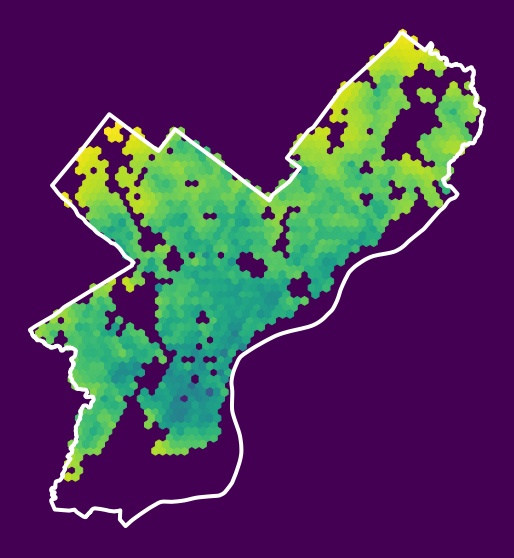

In [60]:
fig, ax = plt.subplots(figsize=(10, 10), facecolor=plt.get_cmap("viridis")(0))

# Plot the log of the Graffiti distance
x = salesXY[:, 0]
y = salesXY[:, 1]
ax.hexbin(x, y, C=sales["logDistGraffiti"].values, gridsize=60)

# Plot the city limits
city_limits.plot(ax=ax, facecolor="none", edgecolor="white", linewidth=4)

ax.set_axis_off()
ax.set_aspect("equal")

## Example #2: Subway stops

Use the `osmnx` package to get subway stops in Philly — we can use the `ox.geometries_from_polygon()` function.

- To select subway stations, we can use `station=subway`: see the [OSM Wikipedia](https://wiki.openstreetmap.org/wiki/Tag:station%3Dsubway)
- See [Lecture 9A](https://musa-550-fall-2021.github.io/slides/lecture-9A.html) for a reminder on osmnx!

In [75]:
import osmnx as ox

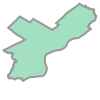

In [76]:
# Get the geometry from the city limits
city_limits_outline = city_limits.to_crs(epsg=4326).squeeze().geometry

city_limits_outline

In [77]:
# Get the subway stops within the city limits
subway = ox.geometries_from_polygon(city_limits_outline, tags={"station": "subway"})

# Convert to 3857 (meters)
subway = subway.to_crs(epsg=3857)

subway.head()

addr:city                name network operator  \
element_type osmid                                                          
node         469917297  Philadelphia  15th-16th & Locust   PATCO    PATCO   
             469917298  Philadelphia   9th-10th & Locust   PATCO    PATCO   
             471026103  Philadelphia  12th-13th & Locust   PATCO    PATCO   
             650938316           NaN         63rd Street   SEPTA    SEPTA   
             650959043           NaN         56th Street   SEPTA    SEPTA   

                       platforms public_transport  railway station subway  \
element_type osmid                                                          
node         469917297         1          station  station  subway    yes   
             469917298         1          station  station  subway    yes   
             471026103         1          station  station  subway    yes   
             650938316       NaN          station  station  subway    yes   
             650959043       NaN          station  station  subway    yes   

                       wheelchair  wikidata  \
element_type osmid                            
node         469917297        yes  Q4551078   
             469917298        yes  Q4646737   
             471026103         no  Q4548965   
             650938316        NaN       NaN   
             650959043        NaN  Q4640769   

                                                  wikipedia  \
element_type osmid                                            
node         469917297  en:15–16th & Locust (PATCO station)   
             469917298   en:9–10th & Locust (PATCO station)   
             471026103  en:12–13th & Locust (PATCO station)   
             650938316                                  NaN   
             650959043                                  NaN   

                                                geometry addr:postcode  \
element_type osmid                                                       
node         469917297  POINT (-8367552.610 4858465.747)           NaN   
             469917298  POINT (-8366424.042 4858281.683)           NaN   
             471026103  POINT (-8366949.703 4858366.817)         19107   
             650938316  POINT (-8376424.717 4860524.238)           NaN   
             650959043  POINT (-8374883.844 4860274.795)           NaN   

                       operator_1 addr:housenumber addr:street  \
element_type osmid                                               
node         469917297        NaN              NaN         NaN   
             469917298        NaN              NaN         NaN   
             471026103        NaN              NaN         NaN   
             650938316        NaN              NaN         NaN   
             650959043        NaN              NaN         NaN   

                       railway:position internet_access old_name addr:state  \
element_type osmid                                                            
node         469917297              NaN             NaN      NaN        NaN   
             469917298              NaN             NaN      NaN        NaN   
             471026103              NaN             NaN      NaN        NaN   
             650938316              NaN             NaN      NaN        NaN   
             650959043              NaN             NaN      NaN        NaN   

                       short_name elevator tram  
element_type osmid                               
node         469917297        NaN      NaN  NaN  
             469917298        NaN      NaN  NaN  
             471026103        NaN      NaN  NaN  
             650938316        NaN      NaN  NaN  
             650959043        NaN      NaN  NaN

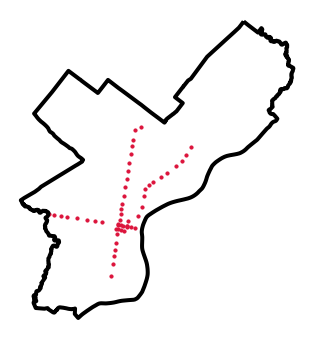

In [78]:
fig, ax = plt.subplots(figsize=(6,6))

# Plot the subway locations
subway.plot(ax=ax, markersize=10, color='crimson')

# City limits, too
city_limits.plot(ax=ax, facecolor='none', edgecolor='black', linewidth=4)

ax.set_axis_off()

The stops on the Market-Frankford and Broad St. subway lines!

### Now, get the distances to the nearest subway stop

We'll use $k=1$ to get the distance to the nearest stop.

In [79]:
# STEP 1: x/y coordinates of subway stops (in EPGS=3857)
subwayXY = get_xy_from_geometry(subway.to_crs(epsg=3857))

# STEP 2: Initialize the algorithm
nbrs = NearestNeighbors(n_neighbors=1)

# STEP 3: Fit the algorithm on the "neighbors" dataset
nbrs.fit(subwayXY)

# STEP 4: Get distances for sale to neighbors
subwayDists, subwayIndices = nbrs.kneighbors(salesXY)

# STEP 5: add back to the original dataset
sales["logDistSubway"] = np.log10(subwayDists[:, 0])

### Let's plot a hex map again!

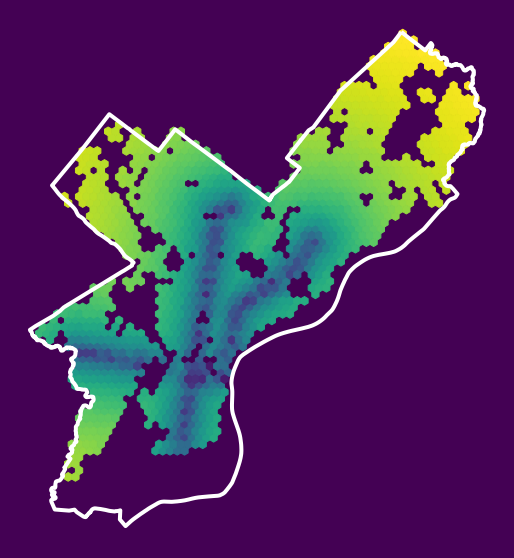

In [80]:
fig, ax = plt.subplots(figsize=(10,10), facecolor=plt.get_cmap('viridis')(0))

# Plot the log of the subway distance
x = salesXY[:,0]
y = salesXY[:,1]
ax.hexbin(x, y, C=sales['logDistSubway'].values, gridsize=60)

# Plot the city limits
city_limits.plot(ax=ax, facecolor='none', edgecolor='white', linewidth=4)

ax.set_axis_off()
ax.set_aspect("equal")

Looks like it worked!

## What about correlations?

Let's have a look at the correlations of numerical columns:

In [81]:
import seaborn as sns

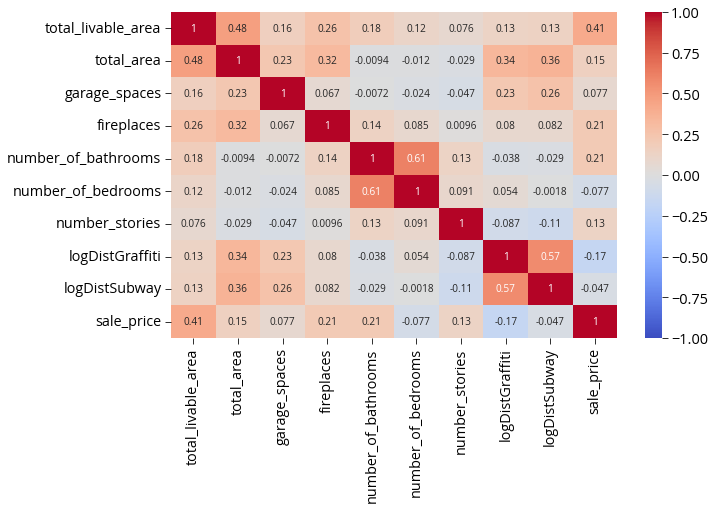

In [82]:
cols = [
    "total_livable_area",
    "total_area",
    "garage_spaces",
    "fireplaces",
    "number_of_bathrooms",
    "number_of_bedrooms",
    "number_stories",
    "logDistGraffiti", # NEW
    "logDistSubway",  # NEW
    "sale_price"
]
sns.heatmap(sales[cols].corr(), cmap='coolwarm', annot=True, vmin=-1, vmax=1);

## Now, let's re-run our model...did it help?

In [83]:
# Numerical columns
num_cols = [
    "total_livable_area",
    "total_area",
    "garage_spaces",
    "fireplaces",
    "number_of_bathrooms",
    "number_of_bedrooms",
    "number_stories",
    "logDistGraffiti", # NEW
    "logDistSubway" # NEW
]

# Categorical columns
cat_cols = ["exterior_condition", "zip_code"]

In [84]:
# Set up the column transformer with two transformers
transformer = ColumnTransformer(
    transformers=[
        ("num", StandardScaler(), num_cols),
        ("cat", OneHotEncoder(handle_unknown="ignore"), cat_cols),
    ]
)

In [85]:
# Initialize the pipeline
# NOTE: only use 20 estimators here so it will run in a reasonable time
pipe = make_pipeline(
    transformer, RandomForestRegressor(n_estimators=20, random_state=42)
)

In [86]:
# Split the data 70/30
train_set, test_set = train_test_split(sales, test_size=0.3, random_state=42)

# the target labels
y_train = np.log(train_set["sale_price"])
y_test = np.log(test_set["sale_price"])

In [87]:
# Fit the training set
# REMINDER: use the training dataframe objects here rather than numpy array
pipe.fit(train_set, y_train);

In [88]:
# What's the test score?
# REMINDER: use the test dataframe rather than numpy array
pipe.score(test_set, y_test)

0.6291417046358436

### A small improvement!

$R^2$ of ~0.58 improved to $R^2$ of ~0.62

### How about the top 30 feature importances now?

In [89]:
def plot_feature_importances(pipeline, num_cols, transformer, top=20, **kwargs):
    """
    Utility function to plot the feature importances from the input
    random forest regressor.

    Parameters
    ----------
    pipeline :
        the pipeline object
    num_cols :
        list of the numerical columns
    transformer :
        the transformer preprocessing step
    top : optional
        the number of importances to plot
    **kwargs : optional
        extra keywords passed to the hvplot function
    """
    # The one-hot step
    ohe = transformer.named_transformers_["cat"]

    # One column for each category type!
    ohe_cols = ohe.get_feature_names()

    # Full list of columns is numerical + one-hot
    features = num_cols + list(ohe_cols)

    # The regressor
    regressor = pipeline["randomforestregressor"]

    # Create the dataframe with importances
    importance = pd.DataFrame(
        {"Feature": features, "Importance": regressor.feature_importances_}
    )

    # Sort importance in descending order and get the top
    importance = importance.sort_values("Importance", ascending=False).iloc[:top]

    # Plot
    return importance.hvplot.barh(
        x="Feature", y="Importance", flip_yaxis=True, **kwargs
    )

In [90]:
plot_feature_importances(pipe, num_cols, transformer, top=30, height=500)

:Bars   [Feature]   (Importance)

### Both new spatial features are in the top 5 in terms of importance!

## Exercise: How about other spatial features?

- I've listed out several other types of potential sources of new distance-based features from OpenDataPhilly
- Choose a few and add new features
- Re-fit the model and evalute the performance on the test set and feature importances

Modify the `get_xy_from_geometry()` function to use the "centroid" of the geometry column.

**Note: you can take the centroid of a Point() or Polygon() object.** For a Point(), you just get the x/y coordinates back.

In [91]:
def get_xy_from_geometry(df):
    """
    Return a numpy array with two columns, where the 
    first holds the `x` geometry coordinate and the second 
    column holds the `y` geometry coordinate
    """
    # NEW: use the centroid.x and centroid.y to support Polygon() and Point() geometries 
    x = df.geometry.centroid.x
    y = df.geometry.centroid.y
    
    return np.column_stack((x, y)) # stack as columns

### Universities

New feature: Distance to the *nearest* university/college

- Source: [OpenDataPhilly](https://www.opendataphilly.org/dataset/philadelphia-universities-and-colleges)
- GeoService URL: https://services.arcgis.com/fLeGjb7u4uXqeF9q/ArcGIS/rest/services/Universities_Colleges/FeatureServer/0


### Example 2: Parks

New feature: Distance to the *nearest* park centroid

* Source: [OpenDataPhilly](https://www.opendataphilly.org/dataset/ppr-properties)
* GeoService URL: https://services.arcgis.com/fLeGjb7u4uXqeF9q/ArcGIS/rest/services/PPR_Properties/FeatureServer/0

**Notes** 
- The park geometries are *polygons*, so you'll need to get the `x` and `y` coordinates of the park *centroids* and calculate the distance to these centroids. 
- You can use the `geometry.centroid.x` and `geometry.centroid.y` values to access these coordinates.

### City Hall

New feature: Distance to City Hall.

* Source: [OpenDataPhilly](https://www.opendataphilly.org/dataset/city-landmarks)
* GeoService URL: https://services.arcgis.com/fLeGjb7u4uXqeF9q/ArcGIS/rest/services/CITY_LANDMARKS/FeatureServer/0

**Notes**

- To identify City Hall, you'll need to pull data where "NAME='City Hall'" and "FEAT_TYPE='Municipal Building'"
- As with the parks, the geometry will be a *polygon*, so you should calculate the distance to the *centroid* of the City Hall polygon

### New Construction Permits

New feature: Distance to the 5 nearest new construction permits from 2019

* Source: [OpenDataPhilly](https://www.opendataphilly.org/dataset/licenses-and-inspections-building-permits)
* CARTO table name: "permits"

**Notes**

* You can pull new construction permits only by selecting where `permitdescription` equals 'NEW CONSTRUCTION PERMIT'
* You can select permits from only 2019 using the `permitissuedate` column

### Aggravated Assaults

New feature: Distance to the 5 nearest aggravated assaults in 2019

* Source: [OpenDataPhilly](https://www.opendataphilly.org/dataset/crime-incidents)
* CARTO table name: "incidents_part1_part2"

**Notes**

* You can pull aggravated assaults only by selecting where `Text_General_Code` equals 'Aggravated Assault No Firearm' or 'Aggravated Assault Firearm'
* You can select crimes from only 2019 using the `dispatch_date` column

### Abandonded Vehicle 311 Calls

New feature: Distance to the 5 nearest abandoned vehicle 311 calls in 2019

* Source: [OpenDataPhilly](https://www.opendataphilly.org/dataset/311-service-and-information-requests)
* CARTO table name: "public_cases_fc"

**Notes**

* You can pull abandonded vehicle calls only by selecting where `service_name` equals 'Abandoned Vehicle'
* You can select crimes from only 2019 using the `requested_datetime` column